In [1]:
import pandas as pd
from utils import *
pd.set_option('display.max_columns', None)

noaa_austin_path = '../data/Austin_NOAA.csv'
noaa_nyc_path = '../data/NYC_NOAA.csv'
noaa_miami_path = '../data/Miami_NOAA.csv'
noaa_chicago_path = '../data/Chicago_NOAA.csv'

om_austin_path = '../data/Austin_OM.csv'
om_nyc_path = '../data/NYC_OM.csv'
om_miami_path = '../data/Miami_OM.csv'
om_chicago_path = '../data/Chicago_OM.csv'

noaa_df_austin = load_NOAA_df(noaa_austin_path)
noaa_df_nyc = load_NOAA_df(noaa_nyc_path)
noaa_df_miami = load_NOAA_df(noaa_miami_path)
noaa_df_chicago = load_NOAA_df(noaa_chicago_path)

om_df_austin = load_OM_df(om_austin_path)
om_df_nyc = load_OM_df(om_nyc_path)
om_df_miami = load_OM_df(om_miami_path)
om_df_chicago = load_OM_df(om_chicago_path)

noaa_data_austin, austin_predictor = merge(noaa_df_austin, om_df_austin)
noaa_data_nyc, nyc_predictor = merge(noaa_df_nyc, om_df_nyc)
noaa_data_miami, miami_predictor = merge(noaa_df_miami, om_df_miami)
noaa_data_chicago, chicago_predictor = merge(noaa_df_chicago, om_df_chicago)

In [2]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a 2x2 subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=("Austin", "NYC", "Miami", "Chicago"))

# Assuming 'MaxTemperature' is the column you want to plot

# Austin
fig.add_trace(
    go.Scatter(x=noaa_df_austin['date'], y=noaa_df_austin['maxtemperature'], name="Austin"),
    row=1, col=1
)

# NYC
fig.add_trace(
    go.Scatter(x=noaa_df_nyc['date'], y=noaa_df_nyc['maxtemperature'], name="NYC"),
    row=1, col=2
)

# Miami
fig.add_trace(
    go.Scatter(x=noaa_df_miami['date'], y=noaa_df_miami['maxtemperature'], name="Miami"),
    row=2, col=1
)

# Chicago
fig.add_trace(
    go.Scatter(x=noaa_df_chicago['date'], y=noaa_df_chicago['maxtemperature'], name="Chicago"),
    row=2, col=2
)

# Update layout
fig.update_layout(height=600, width=800, title_text="Max Temperature Trends")

# Show plot
fig.show()

In [3]:
# Create a 2x2 subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=("Austin", "NYC", "Miami", "Chicago"))

# Assuming 'MaxTemperature' is the column you want to plot

# Austin
fig.add_trace(
    go.Scatter(x=noaa_data_austin['date'], y=noaa_data_austin['maxtemperature'], name="Austin"),
    row=1, col=1
)

# NYC
fig.add_trace(
    go.Scatter(x=noaa_data_nyc['date'], y=noaa_data_nyc['maxtemperature'], name="NYC"),
    row=1, col=2
)

# Miami
fig.add_trace(
    go.Scatter(x=noaa_data_miami['date'], y=noaa_data_miami['maxtemperature'], name="Miami"),
    row=2, col=1
)

# Chicago
fig.add_trace(
    go.Scatter(x=noaa_data_chicago['date'], y=noaa_data_chicago['maxtemperature'], name="Chicago"),
    row=2, col=2
)

# Update layout
fig.update_layout(height=600, width=800, title_text="Max Temperature Trends")

# Show plot
fig.show()

In [4]:
# Start  by training on NYC data
columns_to_ignore = ['date', 'next_day_max_temp']
target_column = 'next_day_max_temp'

Epoch 1/10
672/672 [==============================] - 7s 5ms/step - loss: 692.7118 - val_loss: 87.0684
Epoch 2/10
672/672 [==============================] - 3s 4ms/step - loss: 142.2211 - val_loss: 76.8807
Epoch 3/10
672/672 [==============================] - 3s 4ms/step - loss: 131.9330 - val_loss: 68.5519
Epoch 4/10
672/672 [==============================] - 3s 4ms/step - loss: 128.5075 - val_loss: 67.1192
Epoch 5/10
672/672 [==============================] - 3s 4ms/step - loss: 122.7622 - val_loss: 68.3704
Epoch 6/10
672/672 [==============================] - 3s 4ms/step - loss: 121.0193 - val_loss: 67.3876
Epoch 7/10
672/672 [==============================] - 3s 4ms/step - loss: 119.1414 - val_loss: 66.9026
Epoch 8/10
672/672 [==============================] - 3s 4ms/step - loss: 114.4247 - val_loss: 68.3116
Epoch 9/10
672/672 [==============================] - 3s 4ms/step - loss: 110.8913 - val_loss: 68.1347
Epoch 10/10
672/672 [==============================] - 3s 4ms/step - loss

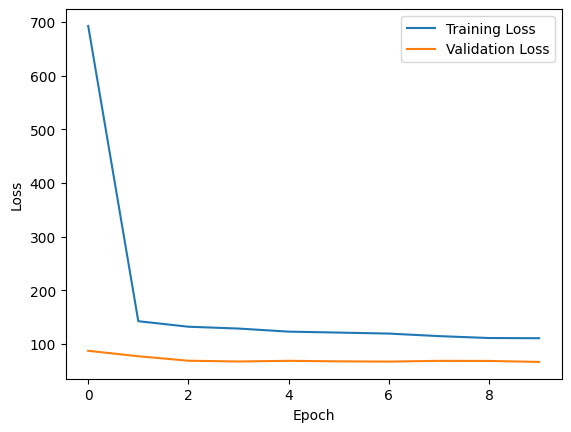

In [16]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, LayerNormalization, Bidirectional, GRU, SimpleRNN
from keras.regularizers import l2
from keras.optimizers import *
from keras.optimizers.schedules import CosineDecay
from keras.callbacks import EarlyStopping, LearningRateScheduler
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

data = noaa_data_nyc

# Prepare the data for LSTM
features = data.drop(columns=columns_to_ignore).columns
target = target_column

# Split the data into training, validation, and testing sets
train_size = int(len(data) * 0.7)
val_size = int(len(data) * 0.15)
train_data = data[:train_size]
val_data = data[train_size:train_size+val_size]
test_data = data[train_size+val_size:]

# Scale the features using only the training data
scaler_features = StandardScaler()
train_features = scaler_features.fit_transform(train_data[features])
val_features = scaler_features.transform(val_data[features])
test_features = scaler_features.transform(test_data[features])

# Create the input sequences and corresponding labels for the LSTM model
def create_sequences(features, target, seq_length):
    X = []
    y = []
    for i in range(len(features) - seq_length):
        X.append(features[i:i+seq_length])
        y.append(target[i+seq_length])
    return np.array(X), np.array(y)

seq_length = 20  # Number of previous days to use as input
X_train, y_train = create_sequences(train_features, train_data[target].values, seq_length)
X_val, y_val = create_sequences(val_features, val_data[target].values, seq_length)
X_test, y_test = create_sequences(test_features, test_data[target].values, seq_length)

# Build the LSTM model with regularization and dropout
# return_sequences=True
model = Sequential()
model.add(LSTM(25, return_sequences=True, input_shape=(seq_length, X_train.shape[2]), kernel_regularizer=l2(0.01), recurrent_regularizer=l2(0.01)))
model.add(Dropout(0.2))
model.add(LSTM(25, kernel_regularizer=l2(0.01), recurrent_regularizer=l2(0.01)))
model.add(Dropout(0.2))
model.add(Dense(50))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model with learning rate schedule
optimizer = AdamW()
model.compile(optimizer=optimizer, loss='mse')

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1, validation_data=(X_val, y_val),
                    callbacks=[early_stopping], shuffle=False)

# Plot the loss and validation loss over time
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [15]:
from sklearn.metrics import explained_variance_score

# Make predictions on the test data
y_pred = model.predict(X_test).reshape(-1)
# y_pred = model(X_test).detach().numpy().reshape(-1)
# y_test = y_test.numpy().reshape(-1) 

print(y_pred)
print(y_test)

# Print explained variance on the test data
print("Explained Variance (R-squared) on Test Data:", explained_variance_score(y_test, y_pred))

# Print mean squared error on the test data
mse = np.mean((y_pred - y_test)**2)
print("Mean Squared Error (MSE) on Test Data:", mse)

mae = np.mean(np.abs(y_pred - y_test))
print("Mean Absolute Error (MAE) on Test Data:", mae)

std_error = np.std(y_pred - y_test)
print("Standard Error on Test Data:", std_error)

confidence_interval = 1.96 * std_error

# Create upper and lower bounds for uncertainty shading
upper_bound = y_pred + confidence_interval
lower_bound = y_pred - confidence_interval

# Plot the predicted vs. actual values
# Create traces for actual and predicted values
trace_actual = go.Scatter(
    x=np.arange(len(y_test)),
    y=y_test,
    mode='lines',
    name='Actual'
)

trace_predicted = go.Scatter(
    x=np.arange(len(y_pred)),
    y=y_pred,
    mode='lines',
    name='Predicted'
)

# Create traces for the uncertainty shading
trace_upper_bound = go.Scatter(
    x=np.arange(len(y_pred)),
    y=upper_bound,
    mode='lines',
    marker=dict(color="#444"),
    line=dict(width=0),
    showlegend=False
)

trace_lower_bound = go.Scatter(
    x=np.arange(len(y_pred)),
    y=lower_bound,
    mode='lines',
    marker=dict(color="#444"),
    line=dict(width=0),
    fillcolor='rgba(68, 68, 68, 0.3)',
    fill='tonexty',
    showlegend=False
)

# Create the layout for the figure
layout = go.Layout(
    title='Predicted vs. Actual Values with 95% Confidence Interval',
    xaxis=dict(title='Data Points'),
    yaxis=dict(title='Values')
)

# Create the figure
fig = go.Figure(data=[trace_actual, trace_predicted, trace_upper_bound, trace_lower_bound], layout=layout)

# Display the figure
fig.show()

144/144 [==============================] - 1s 3ms/step
[82.766106 82.81977  84.11871  ... 50.614742 50.380096 49.965298]
[82. 84. 85. ... 63. 51. 48.]
Explained Variance (R-squared) on Test Data: 0.789681942756272
Mean Squared Error (MSE) on Test Data: 66.57309397101615
Mean Absolute Error (MAE) on Test Data: 6.42280965310894
Standard Error on Test Data: 8.132858184868713


In [12]:
last_X_test = X_test[-1]

print(last_X_test.shape)

# inverse transform the last X_test
last_X_test = scaler_features.inverse_transform(last_X_test)
last_X_test = last_X_test[2:]

columns_to_ignore_set = set(columns_to_ignore)

# Final entry
X1 = nyc_predictor[~nyc_predictor.index.isin(columns_to_ignore_set)]
X1 = X1.to_numpy().reshape(1, -1)

missing_predictor = data.iloc[-1]
X2 = missing_predictor[~missing_predictor.index.isin(columns_to_ignore_set)]
X2 = X2.to_numpy().reshape(1, -1)

X = np.stack((X2, X1), axis=1)[0]

# add X to the bottom of last_X_test
X = np.vstack((last_X_test, X))

# Scale the features using only the training data
X_scaled = scaler_features.transform(X)

# Reshape by adding a new axis
X_scaled = X_scaled.reshape(1, X_scaled.shape[0], X_scaled.shape[1])

(7, 71)


c:\Users\kmfoc\My Drive\BU Files\BU Masters\Work\venv\lib\site-packages\sklearn\base.py:464: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



In [13]:
#57 is the correct answer for NYC
prediction = model.predict(X_scaled)
print(f"Predicted temperature: {prediction[0]}")
# add upper and lower bounds
upper_bound = prediction + confidence_interval
lower_bound = prediction - confidence_interval
print(f"Upper bound: {upper_bound[0]}")
print(f"Lower bound: {lower_bound[0]}")

1/1 [==============================] - 0s 23ms/step
Predicted temperature: [53.30947]
Upper bound: [86.66027]
Lower bound: [19.958672]
